In [1]:
import os
os.environ["HF_HUB_ENABLE_PICKLE_EXPERIMENTAL"] = "1"  # allow .bin weights (SD 1.5)
os.environ["TRANSFORMERS_NO_TF"] = "1"                 # don't try TensorFlow
os.environ["TRANSFORMERS_NO_FLAX"] = "1"

from dataclasses import dataclass
from pathlib import Path
from typing import List

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from tqdm.auto import tqdm

from diffusers import StableDiffusionInpaintPipeline
from diffusers.models.attention_processor import LoRAAttnProcessor
from diffusers.optimization import get_cosine_schedule_with_warmup

c:\Users\SyedM\miniconda3\envs\cv-ai311\Lib\site-packages\diffusers\utils\outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
# Cell 1: Training config

@dataclass
class TrainConfig:
    model_id: str = "stable-diffusion-v1-5/stable-diffusion-inpainting"
    base_dir: Path = Path(".")
    image_size: int = 512

    train_batch_size: int = 4      # 4090 can do 2–4, start with 2
    num_epochs: int = 1
    max_train_steps: int = 1000      # start small; bump later (e.g. 800+)
    learning_rate: float = 1e-4
    lr_warmup_steps: int = 20
    gradient_accumulation_steps: int = 1

    device: str = "cuda" if torch.cuda.is_available() else "cpu"
    mixed_precision: str = "fp16"

    output_dir: Path = Path("lora_inpainting")
    seed: int = 42

cfg = TrainConfig()
cfg.output_dir.mkdir(parents=True, exist_ok=True)
cfg


TrainConfig(model_id='stable-diffusion-v1-5/stable-diffusion-inpainting', base_dir=WindowsPath('.'), image_size=512, train_batch_size=4, num_epochs=1, max_train_steps=1000, learning_rate=0.0001, lr_warmup_steps=20, gradient_accumulation_steps=1, device='cuda', mixed_precision='fp16', output_dir=WindowsPath('lora_inpainting'), seed=42)

In [3]:
# Cell 2: Load base SD 1.5 inpainting pipeline and freeze big parts

torch.manual_seed(cfg.seed)

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    cfg.model_id,
    torch_dtype=torch.float16 if cfg.device == "cuda" else torch.float32,
)
pipe.to(cfg.device)

unet = pipe.unet
vae = pipe.vae
text_encoder = pipe.text_encoder
tokenizer = pipe.tokenizer
noise_scheduler = pipe.scheduler

vae.requires_grad_(False)
text_encoder.requires_grad_(False)
unet.requires_grad_(False)

print("Pipeline loaded on:", cfg.device)
print("UNet dtype:", unet.dtype)


c:\Users\SyedM\miniconda3\envs\cv-ai311\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder\model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

c:\Users\SyedM\miniconda3\envs\cv-ai311\Lib\site-packages\diffusers\utils\outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


Pipeline loaded on: cuda
UNet dtype: torch.float16


In [4]:
# Cell 3: Dataset over prepared/original + inpainting/input + inpainting/mask

class InpaintingLoraDataset(Dataset):
    def __init__(self, base_dir: Path, image_size: int = 512):
        self.prepared_dir = base_dir / "prepared_orig"
        self.orig_dir = self.prepared_dir / "original"
        self.dmg_dir = self.prepared_dir / "inpainting" / "input"
        self.mask_dir = self.prepared_dir / "inpainting" / "mask"
        self.image_size = image_size

        self.files: List[Path] = sorted(
            f for f in self.orig_dir.iterdir()
            if f.suffix.lower() in {".png", ".jpg", ".jpeg"}
            and (self.dmg_dir / f.name).exists()
            and (self.mask_dir / f.name).exists()
        )

        self.img_tf = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),  # [0,1]
        ])
        self.to_sd = transforms.Normalize([0.5, 0.5, 0.5],
                                          [0.5, 0.5, 0.5])  # → [-1,1]

        self.prompt = "restore the missing regions, realistic photo, no text, no watermark"

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx].name
        orig = Image.open(self.orig_dir / fname).convert("RGB")
        dmg = Image.open(self.dmg_dir / fname).convert("RGB")
        mask = Image.open(self.mask_dir / fname).convert("L")

        orig = self.img_tf(orig)
        dmg = self.img_tf(dmg)

        mask = transforms.Resize(
            (self.image_size, self.image_size),
            interpolation=transforms.InterpolationMode.NEAREST
        )(mask)
        mask = transforms.ToTensor()(mask)  # [1,H,W]

        return {
            "original": self.to_sd(orig),
            "damaged": self.to_sd(dmg),
            "mask": mask,
            "prompt": self.prompt,
        }

dataset = InpaintingLoraDataset(cfg.base_dir, cfg.image_size)
print("Dataset size:", len(dataset))
print("Example files:", [p.name for p in dataset.files[:5]])


Dataset size: 74355
Example files: ['test-00000-of-00028_000000.png', 'test-00000-of-00028_000001.png', 'test-00000-of-00028_000002.png', 'test-00000-of-00028_000003.png', 'test-00000-of-00028_000004.png']


In [5]:
# Cell 4: DataLoader (num_workers=0 is safest on Windows/Jupyter)

train_loader = DataLoader(
    dataset,
    batch_size=cfg.train_batch_size,
    shuffle=True,
    num_workers=0,
)

# quick sanity check
for batch in train_loader:
    print("Batch keys:", batch.keys())
    print("original:", batch["original"].shape)
    print("damaged :", batch["damaged"].shape)
    print("mask    :", batch["mask"].shape)
    break


Batch keys: dict_keys(['original', 'damaged', 'mask', 'prompt'])
original: torch.Size([4, 3, 512, 512])
damaged : torch.Size([4, 3, 512, 512])
mask    : torch.Size([4, 1, 512, 512])


In [6]:
# Cell 5: Attach LoRA attention processors and collect params

lora_attn_procs = {}

for name in unet.attn_processors.keys():
    # Determine hidden_size by block
    if name.startswith("mid_block"):
        hidden_size = unet.config.block_out_channels[-1]
    elif name.startswith("up_blocks"):
        block_id = int(name.split(".")[1])
        hidden_size = list(reversed(unet.config.block_out_channels))[block_id]
    elif name.startswith("down_blocks"):
        block_id = int(name.split(".")[1])
        hidden_size = unet.config.block_out_channels[block_id]
    else:
        hidden_size = unet.config.block_out_channels[0]

    # Self-attn vs cross-attn
    if "attn1" in name:
        cross_attention_dim = None
    else:
        cross_attention_dim = unet.config.cross_attention_dim

    lora_attn_procs[name] = LoRAAttnProcessor(
        hidden_size=hidden_size,
        cross_attention_dim=cross_attention_dim,
    )

unet.set_attn_processor(lora_attn_procs)
print("LoRA modules attached:", len(unet.attn_processors))

# Collect ONLY LoRA parameters
trainable_params = []
for proc in unet.attn_processors.values():
    if isinstance(proc, LoRAAttnProcessor):
        trainable_params.extend(list(proc.parameters()))

print("Trainable LoRA params:", sum(p.numel() for p in trainable_params))


LoRA modules attached: 32
Trainable LoRA params: 797184


In [7]:
# Cell 6: Optimizer + LR scheduler

optimizer = torch.optim.AdamW(trainable_params, lr=cfg.learning_rate)

steps_per_epoch = max(1, len(train_loader) // cfg.gradient_accumulation_steps)
max_train_steps = min(cfg.max_train_steps, cfg.num_epochs * steps_per_epoch)
print("Steps/epoch:", steps_per_epoch)
print("Actual train steps:", max_train_steps)

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=cfg.lr_warmup_steps,
    num_training_steps=max_train_steps,
)


Steps/epoch: 18589
Actual train steps: 1000


In [8]:
# Cell 7: Training loop (dtype-safe)

def encode_latents(img: torch.Tensor) -> torch.Tensor:
    """
    img: [B,3,H,W] in [-1,1]
    returns: latents [B,4,H/8,W/8]
    """
    img = img.to(cfg.device, dtype=vae.dtype)
    latents = vae.encode(img).latent_dist.sample()
    latents = latents * 0.18215  # SD scaling
    return latents


global_step = 0
unet.train()

pbar = tqdm(range(max_train_steps))
pbar.set_description("LoRA training")

print("Starting training: max_train_steps =", max_train_steps)
print("UNet dtype:", unet.dtype)

for epoch in range(cfg.num_epochs):
    print("Epoch", epoch)
    for batch_idx, batch in enumerate(train_loader):
        if global_step >= max_train_steps:
            break

        with torch.no_grad():
            orig = batch["original"].to(cfg.device)
            dmg = batch["damaged"].to(cfg.device)
            mask = batch["mask"].to(cfg.device)

            orig_latents = encode_latents(orig)
            dmg_latents = encode_latents(dmg)

            noise = torch.randn_like(orig_latents)
            bsz = orig_latents.shape[0]
            timesteps = torch.randint(
                0,
                noise_scheduler.config.num_train_timesteps,
                (bsz,),
                device=orig_latents.device,
                dtype=torch.long,
            )
            noisy_latents = noise_scheduler.add_noise(orig_latents, noise, timesteps)

            mask_latents = torch.nn.functional.interpolate(
                mask,
                size=noisy_latents.shape[-2:],
                mode="nearest",
            )

            # cast everything going into UNet to unet.dtype
            noisy_latents = noisy_latents.to(unet.dtype)
            mask_latents = mask_latents.to(unet.dtype)
            dmg_latents = dmg_latents.to(unet.dtype)
            latent_model_input = torch.cat(
                [noisy_latents, mask_latents, dmg_latents],
                dim=1,
            )

            text_inputs = tokenizer(
                batch["prompt"],
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            text_emb = text_encoder(
                text_inputs.input_ids.to(cfg.device)
            )[0].to(unet.dtype)

            noise = noise.to(unet.dtype)
            orig_latents = orig_latents.to(unet.dtype)

        # UNet + LoRA forward
        model_pred = unet(
            latent_model_input,
            timesteps,
            encoder_hidden_states=text_emb,
        ).sample

        # target per scheduler prediction_type
        if noise_scheduler.config.prediction_type == "epsilon":
            target = noise
        elif noise_scheduler.config.prediction_type == "v_prediction":
            target = noise_scheduler.get_velocity(orig_latents, noise, timesteps)
        else:
            raise ValueError(f"Unknown prediction_type {noise_scheduler.config.prediction_type}")

        loss = nn.functional.mse_loss(model_pred.float(), target.float(), reduction="mean")
        loss.backward()

        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()

        global_step += 1
        pbar.update(1)
        pbar.set_postfix(loss=loss.item())

        if global_step >= max_train_steps:
            break

print("Training done. Steps:", global_step)


  0%|          | 0/1000 [00:00<?, ?it/s]

Starting training: max_train_steps = 1000
UNet dtype: torch.float16
Epoch 0


c:\Users\SyedM\miniconda3\envs\cv-ai311\Lib\site-packages\diffusers\models\attention_processor.py:1871: FutureWarning: `LoRAAttnProcessor` is deprecated and will be removed in version 0.26.0. Make sure use AttnProcessor instead by settingLoRA layers to `self.{to_q,to_k,to_v,to_out[0]}.lora_layer` respectively. This will be done automatically when using `LoraLoaderMixin.load_lora_weights`
  deprecate(


Training done. Steps: 1000


In [9]:
# Cell 8: Save LoRA attention processors

unet.save_attn_procs(cfg.output_dir)
print("Saved LoRA weights to:", cfg.output_dir)

print("Dataset size:", len(dataset))
print("Steps/epoch:", steps_per_epoch)
print("Actual train steps:", max_train_steps)


Saved LoRA weights to: lora_inpainting
Dataset size: 74355
Steps/epoch: 18589
Actual train steps: 1000


In [10]:
# Cell 9: Load base & LoRA pipelines for comparison

from diffusers import StableDiffusionInpaintPipeline

device = cfg.device
base_dir = cfg.base_dir

# Reuse env flags
os.environ["HF_HUB_ENABLE_PICKLE_EXPERIMENTAL"] = "1"
os.environ["TRANSFORMERS_NO_TF"] = "1"
os.environ["TRANSFORMERS_NO_FLAX"] = "1"

model_id = cfg.model_id
lora_dir = cfg.output_dir

# Base pipeline (no LoRA)
pipe_base = StableDiffusionInpaintPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)
pipe_base.enable_attention_slicing()

# LoRA pipeline
pipe_lora = StableDiffusionInpaintPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)
pipe_lora.unet.load_attn_procs(lora_dir)
pipe_lora.enable_attention_slicing()

print("Base and LoRA pipelines ready on", device)


c:\Users\SyedM\miniconda3\envs\cv-ai311\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder\model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

text_encoder\model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Base and LoRA pipelines ready on cuda


In [21]:
# Cell 10: Pick a few random test images

import random

prepared_dir = base_dir / "prepared"
orig_dir = prepared_dir / "original"
dmg_dir = prepared_dir / "inpainting" / "input"
mask_dir = prepared_dir / "inpainting" / "mask"

all_damaged = sorted(
    f for f in dmg_dir.iterdir()
    if f.suffix.lower() in {".png", ".jpg", ".jpeg"}
       and (mask_dir / f.name).exists()
       and (orig_dir / f.name).exists()
)

print("Total pairs available:", len(all_damaged))

num_samples = 20  # how many to display
sample_files = random.sample(all_damaged, min(num_samples, len(all_damaged)))

print("Sampling:")
for p in sample_files:
    print(" -", p.name)


Total pairs available: 5320
Sampling:
 - test-00001-of-00028_000980.png
 - test-00000-of-00028_002418.png
 - test-00001-of-00028_001579.png
 - test-00001-of-00028_000546.png
 - test-00000-of-00028_001607.png
 - test-00001-of-00028_001458.png
 - test-00000-of-00028_003235.png
 - test-00000-of-00028_001550.png
 - test-00000-of-00028_003436.png
 - test-00000-of-00028_002393.png
 - test-00000-of-00028_000358.png
 - test-00000-of-00028_001225.png
 - test-00000-of-00028_000753.png
 - test-00000-of-00028_002976.png
 - test-00001-of-00028_000651.png
 - test-00000-of-00028_001849.png
 - test-00000-of-00028_002324.png
 - test-00001-of-00028_001065.png
 - test-00000-of-00028_000199.png
 - test-00000-of-00028_001166.png


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_000980.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


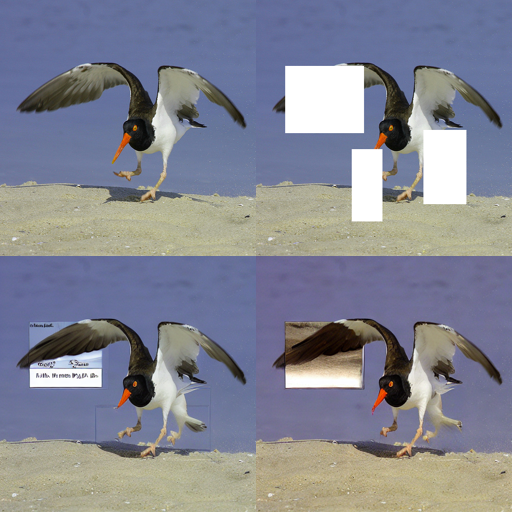

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_002418.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


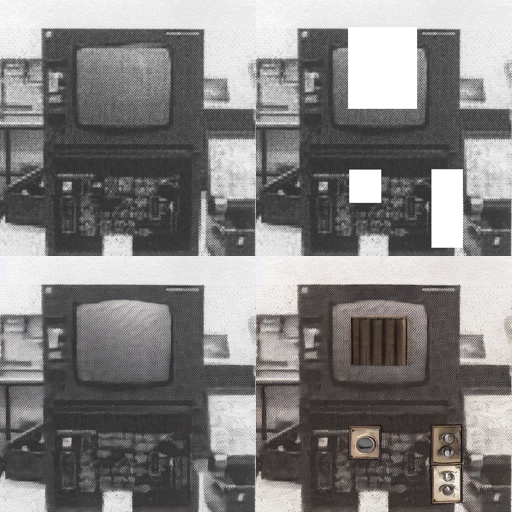

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_001579.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


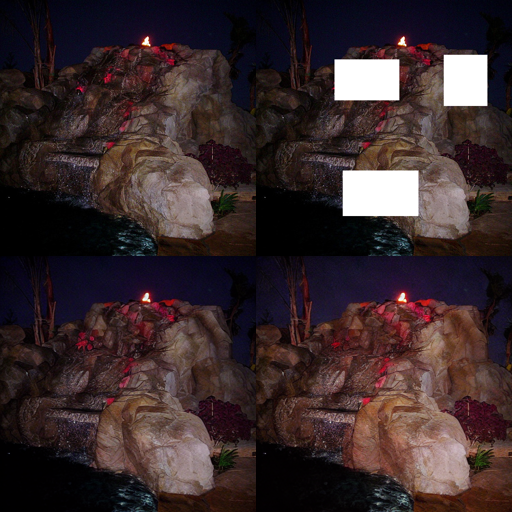

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_000546.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


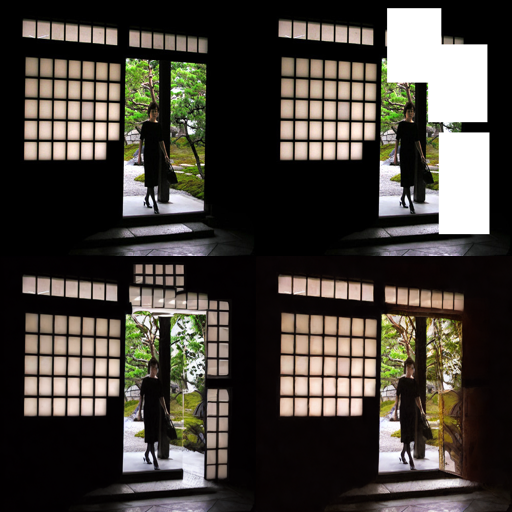

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_001607.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


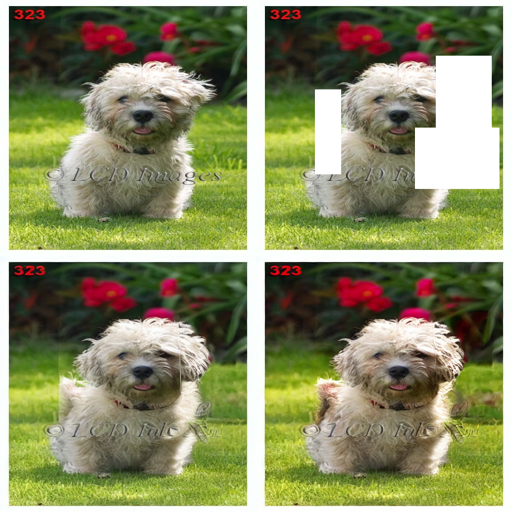

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_001458.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


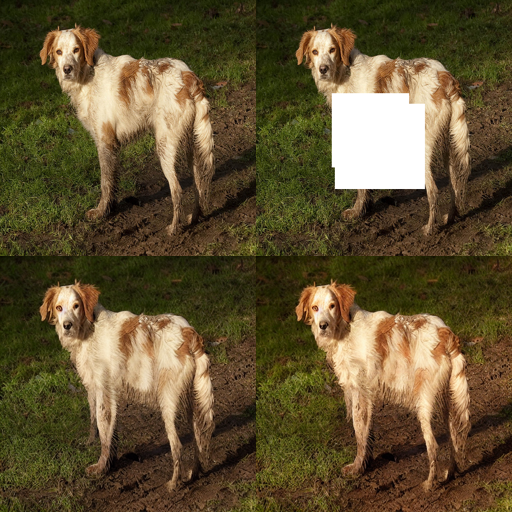

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_003235.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


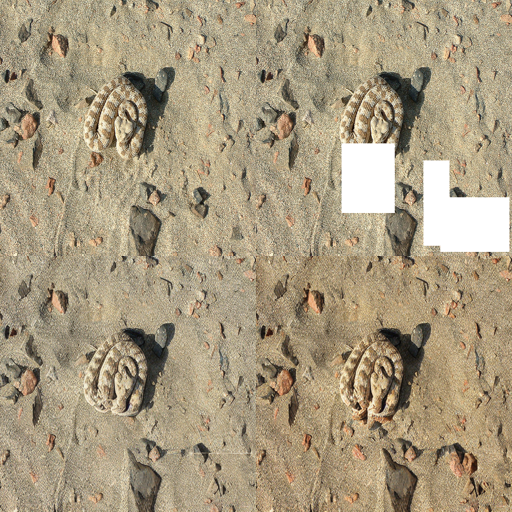

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_001550.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


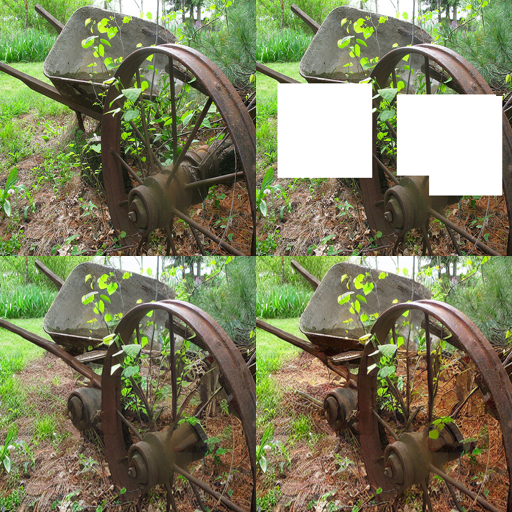

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_003436.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


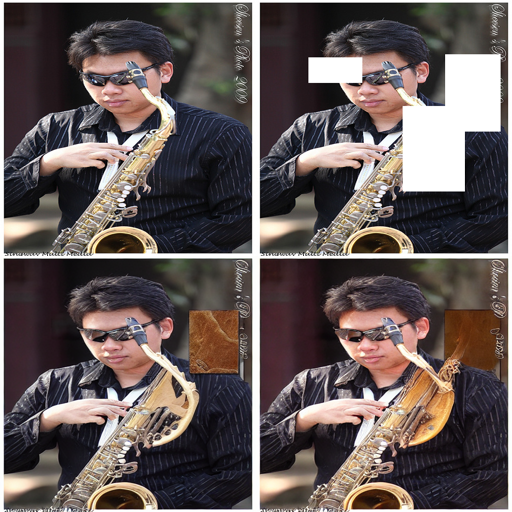

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_002393.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


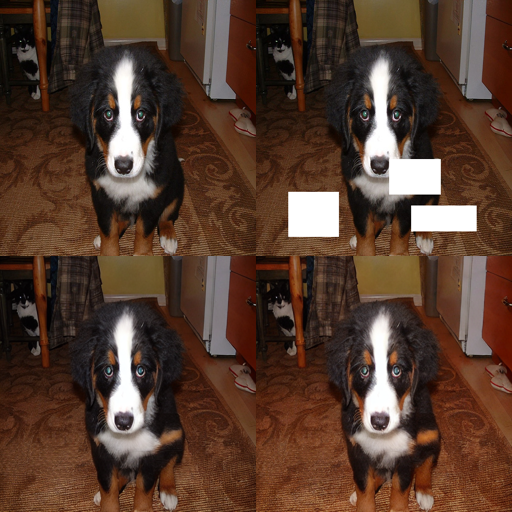

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_000358.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


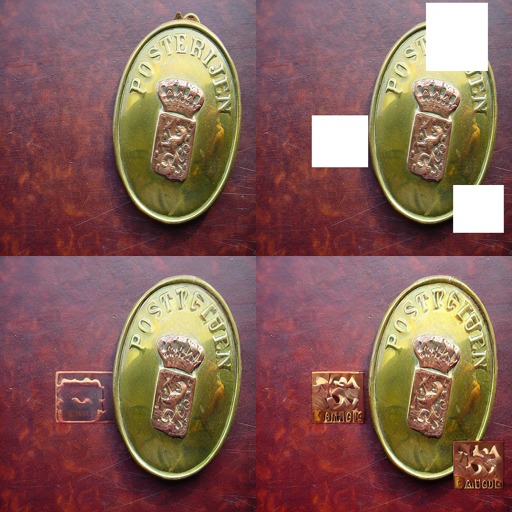

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_001225.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


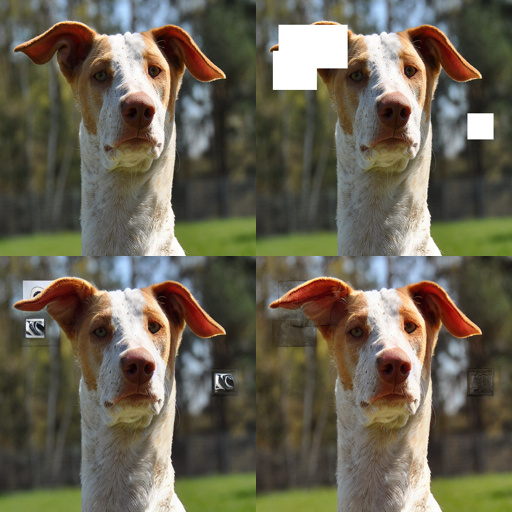

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_000753.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


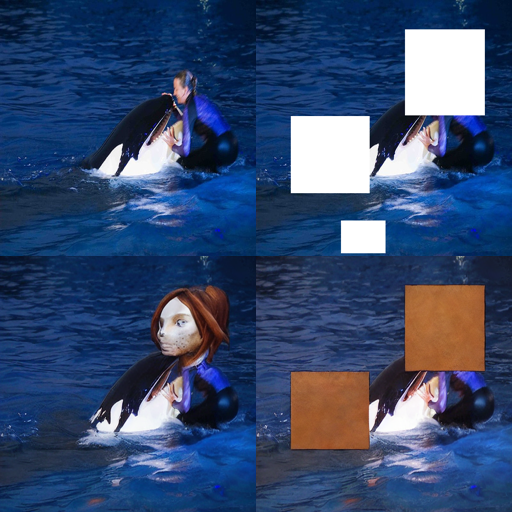

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_002976.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


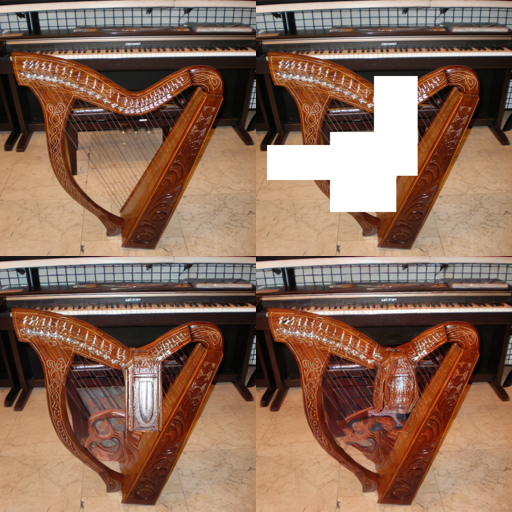

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_000651.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


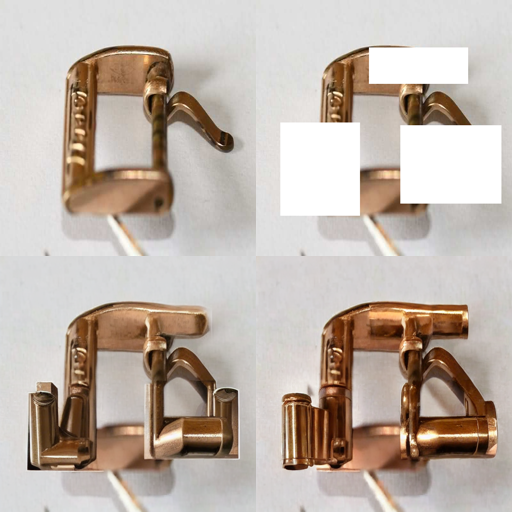

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_001849.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


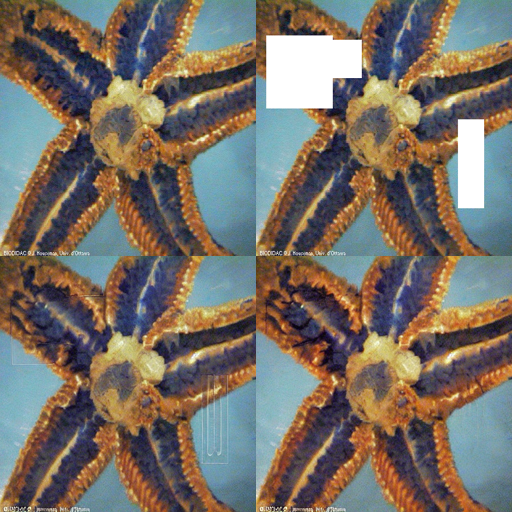

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_002324.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


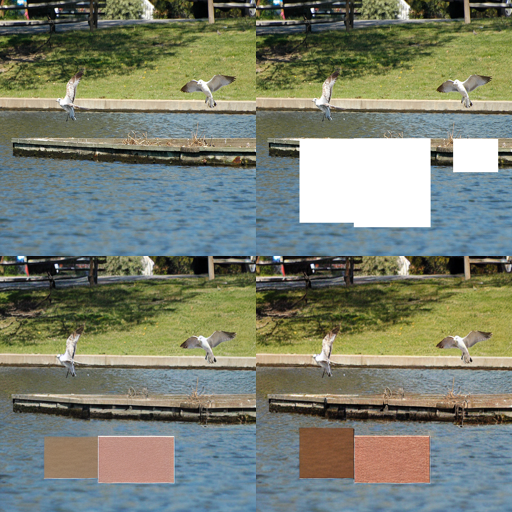

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00001-of-00028_001065.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


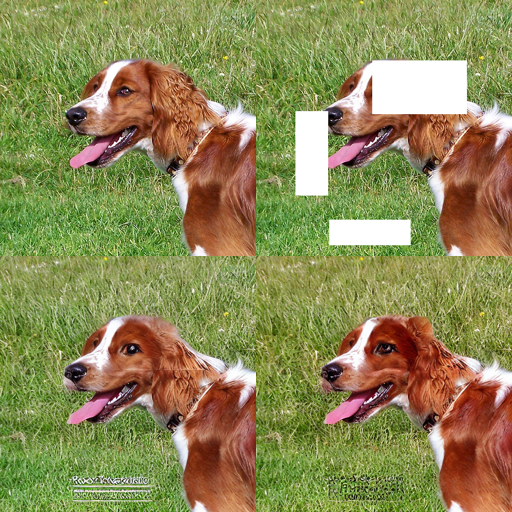

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_000199.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


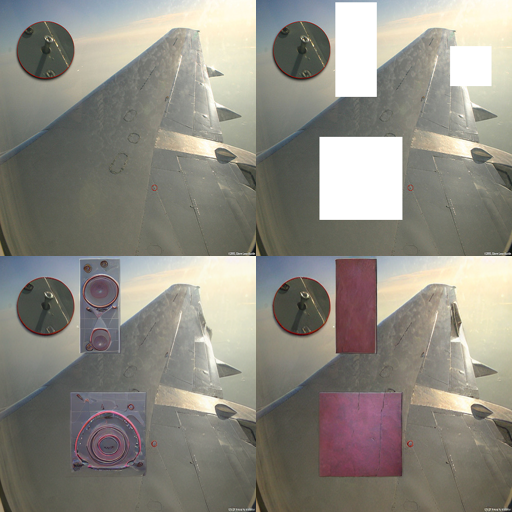

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

File: test-00000-of-00028_001166.png
Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA


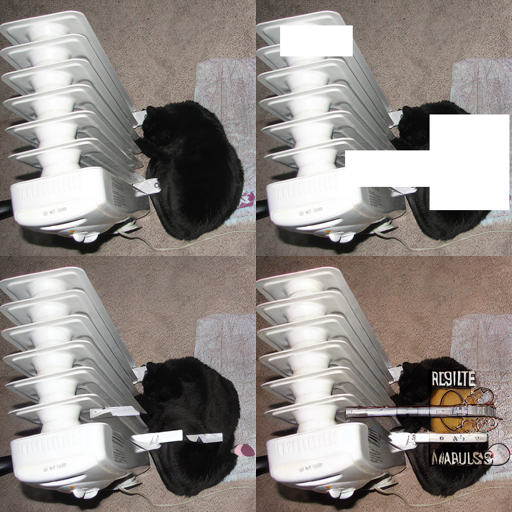

In [27]:
# Cell 11: Run base + LoRA inpainting and DISPLAY side-by-side (no saving)

from PIL import Image
from IPython.display import display

#prompt = "restore the missing regions realistically, match background and lighting. Make sure there is no labels, text or watermark especially if no text is already present"
clean_prompt = (
    "restore the missing regions realistically, "
    "continuous surfaces, natural textures, matching colors"
)

negative_prompt = (
    "text, letters, watermark, logo, caption, subtitles, UI, user interface, random characters, colored blocks, script, "
    "computer window, dialog box, buttons, icons, menu bar, sign, poster, bad artifacts, low quality, deformed, blurry, cropped, ugly"
)

num_inference_steps = 28
guidance_scale = 6
#seed = 12345  # fixed seed so base vs LoRA comparable

def show_comparison(name: str, orig, dmg, base, lora):
    size = (256, 256)
    orig_r = orig.resize(size)
    dmg_r = dmg.resize(size)
    base_r = base.resize(size)
    lora_r = lora.resize(size)

    grid = Image.new("RGB", (size[0] * 2, size[1] * 2), "white")
    grid.paste(orig_r, (0, 0))
    grid.paste(dmg_r, (size[0], 0))
    grid.paste(base_r, (0, size[1]))
    grid.paste(lora_r, (size[0], size[1]))

    print(f"File: {name}")
    print("Top-left: original | Top-right: damaged | Bottom-left: base | Bottom-right: LoRA")
    display(grid)

for dmg_path in sample_files:
    fname = dmg_path.name
    orig_path = orig_dir / fname
    mask_path = mask_dir / fname

    orig = Image.open(orig_path).convert("RGB")
    damaged = Image.open(dmg_path).convert("RGB")
    mask = Image.open(mask_path).convert("L")

    if mask.size != damaged.size:
        mask = mask.resize(damaged.size, resample=Image.NEAREST)

    # Base model
    gen_base = torch.Generator(device=device).manual_seed(seed)
    out_base = pipe_base(
        prompt=clean_prompt,
        negative_prompt=negative_prompt,
        image=damaged,
        mask_image=mask,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=gen_base,
    ).images[0]

    # LoRA model
    gen_lora = torch.Generator(device=device).manual_seed(seed)
    out_lora = pipe_lora(
        prompt=clean_prompt,
        negative_prompt=negative_prompt,
        image=damaged,
        mask_image=mask,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=gen_lora,
    ).images[0]

    show_comparison(fname, orig, damaged, out_base, out_lora)
